## Chapter 1: Getting started with Image Processing

## Setup

In [ ]:
# download repo
!wget -O repository.zip https://github.com/rahiakela/Hands-On-Image-Processing-and-Computer-Vision-with-Python/archive/refs/heads/main.zip

In [11]:
# then extract only the required folder
!unzip -q repository.zip "Hands-On-Image-Processing-and-Computer-Vision-with-Python-main/Chapter01/images/*" -d /content/extracted

In [12]:
!cp -r /content/extracted/Hands-On-Image-Processing-and-Computer-Vision-with-Python-main/Chapter01/images /content/

In [ ]:
!pip install pillow_lut

In [15]:
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
from PIL import Image, ImageFont, ImageDraw, ImageFilter, ImageOps
from PIL.ImageChops import add, subtract, multiply, difference, screen, soft_light, hard_light, overlay, lighter
import PIL.ImageStat as stat
# ! pip install pillow_lut
from pillow_lut import load_cube_file
from skimage import color, exposure, img_as_float, data
from skimage.io import imread, imsave, imshow, show, imread_collection, imshow_collection
from skimage.transform import SimilarityTransform, PiecewiseAffineTransform, warp, swirl, rescale, resize, downscale_local_mean
from skimage.util import view_as_blocks, invert, random_noise, montage
from skimage import measure
import scipy.ndimage as ndimage
from scipy.ndimage import affine_transform
from IPython.display import display
import cv2
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pylab as plt
from time import time
import os

## Reading/Saving/Displaying an image using PIL

The Python Imaging Library (PIL/Pillow) provides convenient functions for image I/O, manipulation, and visualization.

453 340 RGB PNG <class 'PIL.PngImagePlugin.PngImageFile'>


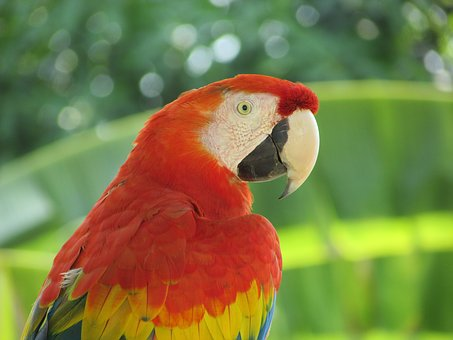

In [16]:
im = Image.open("images/parrot.png")
#im.save('../new images/parrot.png')
print(im.width, im.height, im.mode, im.format, type(im))
display(im)

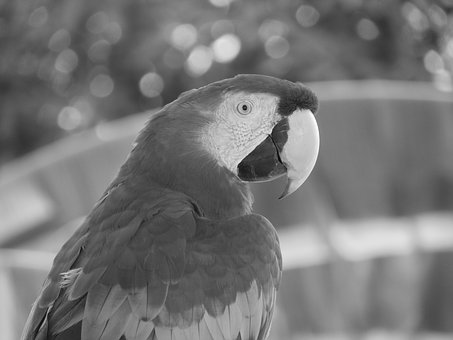

In [17]:
im_g = im.convert('L')                      # convert the RGB color image to a gray-scale image
im_g.save('images/parrot_gray.png')         # save the image to disk
display(Image.open("images/parrot_gray.png")) # read the gray-scale image from disk and show

Let's read images directly from the web using requests.get(), converting the downloaded binary data (the response content) into a BytesIO object, and opening it with Image.open().

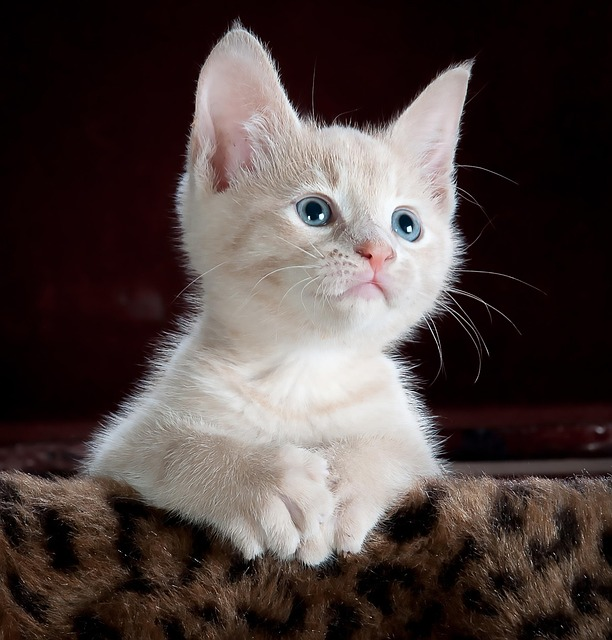

In [20]:
import PIL
import requests
from io import BytesIO

url = 'https://cdn.pixabay.com/photo/2014/11/30/14/11/cat-551554_640.jpg'
#headers = {"User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64; rv:109.0) Gecko/20100101 Firefox/110.0"}
response = requests.get(url) #, headers=headers)

if response.status_code == 200:
    img = Image.open(BytesIO(response.content))
    display(img)
else:
    print(f"Failed to retrieve image. Status code: {response.status_code}")

#Image.open(BytesIO(urlopen(str('https://cdn.pixabay.com/photo/2014/11/30/14/11/cat-551554_640.jpg')).read()))

(328, 240)


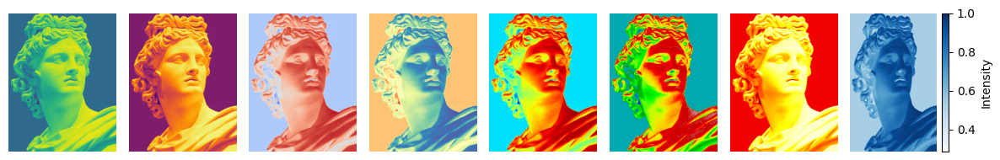

In [21]:
im = plt.imread('images/sculpture.png')
im_gray = np.mean(im, axis=-1)
print(im_gray.shape)
#(256, 256)
i = 1
plt.figure(figsize=(12,2))
for cmap in ['viridis', 'inferno', 'coolwarm', 'Spectral', 'jet', \
             'nipy_spectral', 'hot', 'Blues']:
    plt.subplot(1,8,i), plt.imshow(im_gray, cmap=cmap, aspect='auto')
    plt.axis('off')
    i += 1
plt.colorbar(label='Intensity')
plt.tight_layout()
plt.show()

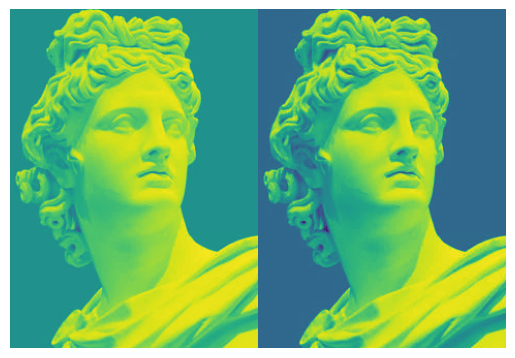

In [22]:
im_gray_avg = np.mean(im, axis=-1)
im_gray_ntsc =  0.299 * im[...,0] + 0.587 * im[...,1] + 0.114 * im[...,2]
plt.imshow(np.hstack((im_gray_avg, im_gray_ntsc))), plt.axis('off');

In [23]:
from skimage import img_as_float, img_as_ubyte

im_float = img_as_float(im)    # Converts safely to float [0, 1]
im_uint8 = img_as_ubyte(im_float)  # Converts safely back to uint8

## Reading/Saving/Displaying an image using Matpotlib

Matplotlib is primarily a plotting library in Python, but it also provides some functions for reading, saving, and displaying images.

In [ ]:
im = mpimg.imread("images/hill.png")  # read the image from disk as a numpy ndarray
print(im.shape, im.dtype, type(im))   # this image contains an α channel, hence num_channels = 4

(960, 1280, 3) float32 <class 'numpy.ndarray'>


In [ ]:
im_dark = im.copy()
print(np.max(im))
im_dark[im_dark < 0.5] = 0    # make the image look darker
mpimg.imsave("images/hill_dark.png", im_dark)  # save the dark image

im_dark = mpimg.imread("images/hill_dark.png")[...,:3] # read the dark image, first 3 color channels
plt.figure(figsize=(12,5))
plt.imshow(np.hstack((im, im_dark))), plt.axis('off'), plt.title('original and the darkened image', size=20)
plt.tight_layout()
plt.show()

### Interpolating while displaying with matplotlib imshow

In [ ]:
im = mpimg.imread("images/monalisa.jpg") # read the image from disk as a numpy ndarray
methods = [None, 'none', 'nearest', 'bilinear', 'bicubic', 'spline16',
'spline36', 'hanning', 'hamming', 'hermite', 'kaiser', 'quadric',
'catrom', 'gaussian', 'bessel', 'mitchell', 'sinc', 'lanczos']
fig, axes = plt.subplots(nrows=3, ncols=6, figsize=(9, 6),
subplot_kw={'xticks': [], 'yticks': []})
fig.subplots_adjust(hspace=0.01, wspace=0.01)
for ax, interp_method in zip(axes.flat, methods):
    ax.imshow(im, interpolation=interp_method)
    ax.set_title(str(interp_method))
#plt.tight_layout()
plt.show()

### Reading/Saving/Displaying an image using scikit-image

In [ ]:
def min_max_normalize(im, low=0, high=255):
    """Normalizes the pixel values of the image im to the specified"""
    """[low, high] range using min-max scaling."""
    return ((high-low)*(im-im.min())/(im.max()-im.min())).astype(np.uint8)

(340, 453, 3) uint8 <class 'numpy.ndarray'> 255 0
(340, 453) float64 0.9966290196078432 0.008944313725490196
(340, 453, 3) 255 0
uint8


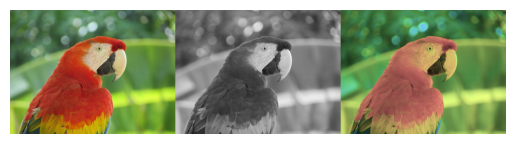

In [ ]:
im = imread("images/parrot.png")  # read mage, provide the correct path
print(im.shape, im.dtype, type(im), im.max(), im.min())
# (362, 486, 3) uint8 <class 'numpy.ndarray'>
im_gray = imread("images/parrot.png", as_gray=True) # read grayscale image
print(im_gray.shape, im_gray.dtype, im_gray.max(), im_gray.min())
#(340, 453, 3) uint8 <class 'numpy.ndarray'> 255 0

im_gray = min_max_normalize(im_gray)
im_gray = color.gray2rgb(im_gray)
print(im_gray.shape, im_gray.max(), im_gray.min())
#(340, 453) float64 0.9966290196078431 0.008944313725490196

hsv = color.rgb2hsv(im) # from RGB to HSV color space
hsv[:, :, 1] = 0.5 # change the saturation
im_hsv = min_max_normalize(color.hsv2rgb(hsv)) # from HSV back to RGB
print(im_hsv.dtype)
# uint8
imsave('images/parrot_hsv.png', im_hsv) # save image to disk

im_hsv = imread("images/parrot_hsv.png")
plt.imshow(np.hstack((im, im_gray, im_hsv))), plt.axis('off')
plt.show()

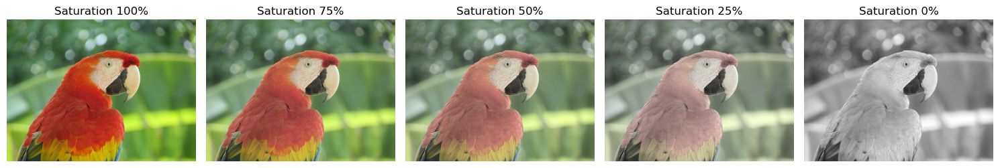

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the image (in BGR)
image = cv2.imread('images/parrot.png')
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Convert to HSV
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Create images with different saturation levels
saturation_factors = [1.0, 0.75, 0.5, 0.25, 0.0]
muted_images = []

for factor in saturation_factors:
    hsv_copy = hsv.copy()
    hsv_copy[..., 1] = (hsv_copy[..., 1] * factor).astype(np.uint8)
    muted_bgr = cv2.cvtColor(hsv_copy, cv2.COLOR_HSV2BGR)
    muted_rgb = cv2.cvtColor(muted_bgr, cv2.COLOR_BGR2RGB)
    muted_images.append(muted_rgb)

# Plot the images
titles = [f"Saturation {int(f*100)}%" for f in saturation_factors]

plt.figure(figsize=(15, 4))
for i, (img, title) in enumerate(zip(muted_images, titles)):
    plt.subplot(1, len(muted_images), i + 1)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
plt.tight_layout()
plt.show()

### Using scikit-image's astronaut dataset

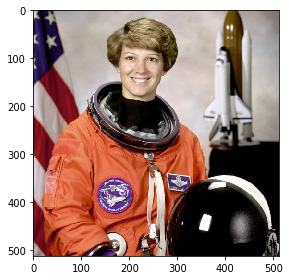

In [ ]:
im = data.astronaut()
plt.imshow(im)
plt.show()

### Reading and displaying multiple images at once

In [ ]:
images = imread_collection('images/image_dir/*.jpg')
print(len(images)) # print number of jpg images in the folder, there were 4 of them
# 4
imshow_collection(images, aspect='auto')
plt.show()

In [ ]:
import cv2
image = cv2.imread('images/model.png')
image_gray = cv2.imread('images/model.png', cv2.IMREAD_GRAYSCALE)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(np.hstack((image, image_rgb,
           np.repeat(image_gray[..., np.newaxis], 3, axis=-1)))), plt.axis('off')
plt.title('image before and after BGR to RGB color conversion and the grayscale image', size=10)
plt.show()

In [ ]:
cv2.imwrite('images/model_yuv.png', cv2.cvtColor(image_rgb,
                                    cv2.COLOR_RGB2YUV))

True

### Block views on images

3


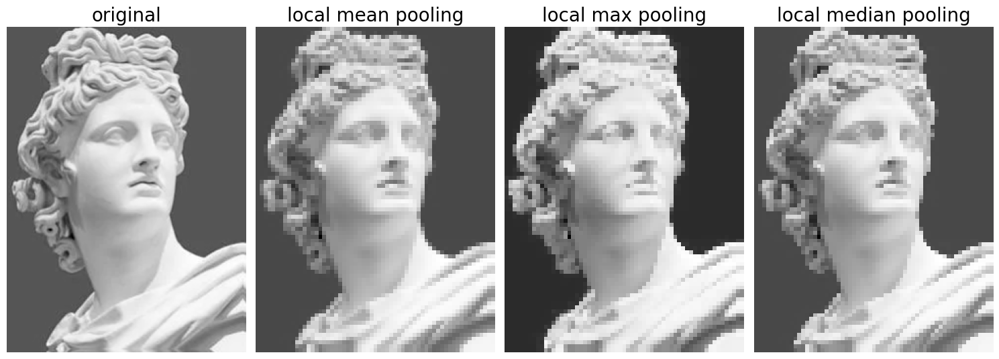

In [ ]:
# get astronaut from skimage.data in grayscale
im = color.rgb2gray(imread('images/sculpture.png')[...,:3])

# size of blocks
block_shape = (4, 4) #(8, 8)

# Ensure image dimensions are divisible by block size
pad_height = (block_shape[0] - im.shape[0] % block_shape[0]) % block_shape[0]
pad_width = (block_shape[1] - im.shape[1] % block_shape[1]) % block_shape[1]

if pad_height != 0 or pad_width != 0:
    # Optional: Pad the image to make it divisible by block size
    im = np.pad(im, ((0, pad_height), (0, pad_width)), mode='reflect')


# see astronaut as a matrix of blocks (of shape block_shape)
view = view_as_blocks(im, block_shape)

# collapse the last two dimensions in one
flatten_view = view.reshape(view.shape[0], view.shape[1], -1)

# resampling the image by taking either the `mean`,
# the `max` or the `median` value of each blocks.
mean_view = np.mean(flatten_view, axis=2)
max_view = np.max(flatten_view, axis=2)
median_view = np.median(flatten_view, axis=2)

plt.figure(figsize=(15,7))
plt.gray()
plt.subplot(141), plt.axis('off'), plt.title('original', size=20), plt.imshow(im)
plt.subplot(142), plt.axis('off'), plt.title('local mean pooling', size=20), plt.imshow(mean_view)
plt.subplot(143), plt.axis('off'), plt.title('local max pooling', size=20), plt.imshow(max_view)
plt.subplot(144), plt.axis('off'), plt.title('local median pooling', size=20), plt.imshow(median_view)
plt.tight_layout()
plt.show()

## Reading/Saving/Displaying an image using opencv-python

In [ ]:
import cv2
image = cv2.imread('images/model.png')
cv2.imshow('Model', image)
cv2.waitKey(0)
print(image.dtype)
# uint8

In [ ]:
image_gray = cv2.imread('images/model.png', cv2.IMREAD_GRAYSCALE)
cv2.imshow('Model Gray', image_gray)
cv2.waitKey(0)

In [ ]:
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(np.hstack((image, image_rgb, np.repeat(image_gray[..., np.newaxis], 3, axis=-1)))); plt.axis('off')
plt.title('image before and after BGR to RGB color conversion and the grayscale image', size=10)

## Reading/Saving an image using imageio

Frame 5 shape: (512, 512, 4)
Frame 6 shape: (512, 512, 4)
Frame 26 shape: (512, 512, 4)
Frame 30 shape: (512, 512, 4)
Frame 31 shape: (512, 512, 4)


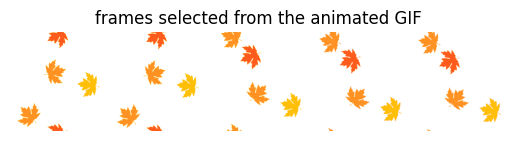

In [ ]:
import imageio

gif_path = 'images/leaves.gif'

np.random.seed(3)
images = []
with imageio.get_reader(gif_path) as reader:
    for i, frame in enumerate(reader):
        if len(images) < 5:
            if np.random.rand() > 0.75:
                images.append(frame)
                print(f"Frame {i + 1} shape: {frame.shape}")
plt.imshow(np.hstack(images)), plt.axis('off')
plt.title('frames selected from the animated GIF', size=12)
plt.show()

In [ ]:
from glob import glob

# read frames for the animation
frames = [imageio.imread(f) for f in glob('images/world/*.png')]

# Save frames as an animated GIF
with imageio.get_writer('images/world.gif', duration=0.1) as writer:
    for frame in frames:
        writer.append_data(frame)

## Displaying image / video with Jupyter (IPython)

In [ ]:
from IPython.display import Image
# Display an image file inline
Image(filename="images/monalisa.jpg")

In [ ]:
from IPython.display import display
from PIL import Image
# Open an image using PIL
img = Image.open("images/monalisa.jpg")
# Display inline in Jupyter
display(img)

In [ ]:
from IPython.display import Video
Video('./images/football.mp4', embed=True, width=640, height=360)

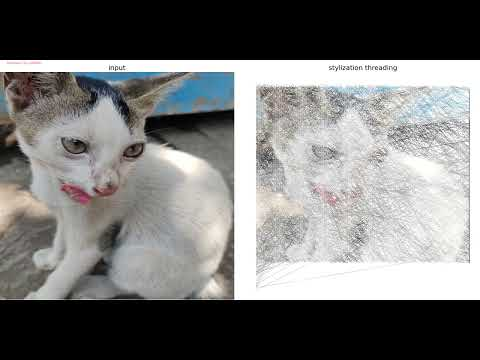

In [ ]:
from IPython.display import YouTubeVideo
display(YouTubeVideo('VydHkSwS6F4'))

In [ ]:
im = Image.open("images/parrot.png")
print(im.mode)
# RGB
im.save("images/parrot.jpg")
#im = Image.open("images/parrot.jpg")
#im2.show()

RGB


In [ ]:
im = Image.open("images/hill_alpha.png")
print(im.mode)
# RGBA
im.convert('RGB').save("images/hill.jpg") # first convert to RGB mode
#im = Image.open("images/hill.jpg")
#im.show()

RGBA


### Image Types (modes)

### Converting from one image mode to another

In [ ]:
im = imread("images/parrot.png", as_gray=True)
print(im.shape)
#(362L, 486L)

(340, 453)


In [ ]:
im = imread("images/ishihara.jpeg")
im_g = color.rgb2gray(im)
print(im.shape, im_g.shape)
plt.figure(figsize=(10,5))
plt.subplot(121), plt.imshow(im, cmap='gray'), plt.axis('off')
plt.subplot(122), plt.imshow(im_g, cmap='gray'), plt.axis('off')
plt.show()

In [ ]:
def colorize(im, hue, saturation=1):
    hsv = color.rgb2hsv(im)
    hsv[:, :, 1] = saturation
    hsv[:, :, 0] = hue
    return color.hsv2rgb(hsv)

from skimage.color import rgba2rgb
im = rgba2rgb(imread('images/model.png'))
hue_rotations = np.linspace(0, 1, 6)
fig, axes = plt.subplots(nrows=1, ncols=7, sharex=True, sharey=True, \
                                                       figsize=(15,4))
axes[0].imshow(im), axes[0].set_axis_off()
axes[0].set_title('grayscale', size=15)
for ax, hue in zip(axes.flat[1:], hue_rotations):
    tinted_im = colorize(im, hue, saturation=0.3)
    ax.imshow(tinted_im, vmin=0, vmax=1)
    ax.set_axis_off()
fig.tight_layout()

In [ ]:
import numpy as np
import matplotlib.pylab as plt

lena = plt.imread("images/monalisa.jpg") # read image from disk as numpy ndarray
lx, ly = lena.shape[:2]

cropped_lena = lena[120:210, 160:220, :]  # crop a region
X, Y = np.ogrid[0:lx, 0:ly]
mask = (X - lx / 2) ** 2 + (Y - ly / 2) ** 2 > lx * ly / 4
masked_lena = lena.copy()
masked_lena[mask,:] = 0 # masks

plt.figure(figsize=(12,5))
plt.subplot(131), plt.imshow(lena, aspect='auto'), plt.axis('off'), plt.title('original', size=15)
plt.subplot(132), plt.imshow(cropped_lena, aspect='auto'), plt.axis('off'), plt.title('cropped', size=15)
plt.subplot(133), plt.imshow(masked_lena, aspect='auto'), plt.axis('off'), plt.title('masked', size=15)
plt.tight_layout()
plt.show()

In [ ]:
v_flipped_lena = np.flipud(lena)  # Vertical flip
h_flipped_lena = np.fliplr(lena)  # horizontal flip
vh_flipped_lena = np.fliplr(v_flipped_lena) #both Vertical & horizontal flip
plt.imshow(np.hstack((lena, v_flipped_lena, h_flipped_lena,  \
                                            vh_flipped_lena)))
plt.axis('off')
plt.show()

In [ ]:
from skimage.transform import SimilarityTransform

def plot_image(im, title='', fontsize=20):
     plt.imshow(im), plt.axis('off'), plt.title(title, size=fontsize)

def plot_images(images, titles, suptitle='', fontsize=20, \
                                supfontsize=22, figsize=(15,7)):
    n = len(images)
    plt.figure(figsize=figsize)
    plt.gray()
    for i in range(n):
        plt.subplot(1,n,i+1), plot_image(images[i], titles[i], fontsize)
    plt.suptitle(suptitle, size=supfontsize)
    plt.tight_layout()
    plt.show()

im = plt.imread('images/monalisa.jpg')


from skimage.transform import warp

def translate(xy, t_x, t_y):
    xy[:, 0] -= t_x
    xy[:, 1] -= t_y
    return xy

im = imread('images/monalisa.jpg')
im_trans = warp(im, translate, map_args={'t_x':-100, 't_y':50}, order=1) # create a dictionary for translation parameters

def rotate(xy, theta):
    theta = np.deg2rad(theta) #np.pi/180*theta # in radian
    xy[:, 0], xy[:, 1] = xy[:, 0]*np.cos(theta) - xy[:,1]*np.sin(theta),   \
                         xy[:, 0]*np.sin(theta) + xy[:,1]*np.cos(theta)
    return xy

# create a dictionary for rotation parameters
im_rot = warp(im, rotate, map_args={'theta':10})

t_x, t_y = im.shape[0]/2, -100
print(t_x, t_y)
tform = SimilarityTransform(scale=0.9, rotation=np.pi/4,
                            translation=(t_x, t_y))
im_sim = warp(im, tform.inverse)
plt.imsave('images/monalisa_sim.jpg', im_sim) # save the transformed image

# Get the transformation matrix
matrix_sim = tform.params
print(matrix_sim)

im_tformed = imread('images/monalisa_sim.jpg')
tform = AffineTransform(np.linalg.inv(matrix_sim))
im_recon_affine = warp(im_tformed, tform.inverse)
matrix_affine = tform.params
print(matrix_affine)

plot_images([im, im_tformed, im_recon_affine],\
            ['original', 'transformed with SimilarityTransform', \
             'Reonstructed with AffineTransform'],\
            'Reconstructing image with affine transform', \
            fontsize=10, supfontsize=15, figsize=(8,5))

In [ ]:
from skimage.transform import swirl

im_swirled = swirl(im, rotation=0, strength=5, radius=300)

plot_images([im_trans, im_rot, im_sim, im_swirled], \
   ['transalation', 'rotation', 'similarity transform', 'swirl transform'],\
   'geometric transformation with warp()', fontsize=10, supfontsize=15, figsize=(12,5))

In [ ]:
im = imread('images/monalisa.jpg', True)
x,y = np.meshgrid(np.float32(np.arange(im.shape[1])), \
      np.float32(np.arange(im.shape[0])))
y = y + 20*np.sin(x/15)
distorted = ndimage.map_coordinates(im, [y.ravel(),x.ravel()])
plt.imshow(distorted.reshape(im.shape)), plt.axis('off')
plt.show()

### Apply Sepia Color Filter

In [ ]:
def sepia_filter_PIL(image_path):
    img = Image.open(image_path)
    width, height = img.size
    pixels = img.load() # create the pixel map
    for py in range(height):
        for px in range(width):
            r, g, b = img.getpixel((px, py))
            pixels[px, py] = (min(255, int(0.393*r + 0.769*g + 0.189*b)), \
                              min(255, int(0.349*r + 0.686*g + 0.168*b)), \
                             min(255, int(0.272*r + 0.534*g + 0.131*b)))
    return img

def sepia_filter_np(image_path):
    im = plt.imread(image_path)
    im = im / im.max()
    R, G, B = im[...,0], im[...,1], im[...,2]
    im_out = np.dstack((0.393 * R + 0.769 * G + 0.189 * B, \
    0.349 * R + 0.686 * G + 0.168 * B, \
    0.272 * R + 0.534 * G + 0.131 * B))
    im_out = np.clip(im_out, 0, 1)
    return (255*im_out).astype(np.uint8)

img_path = 'images/sea_beach.jpeg'
start = time()
im_out_np = sepia_filter_np(img_path)
print('time (np): {:03f} sec'.format(time() - start))
start = time()
im_out_PIL = sepia_filter_PIL(img_path)
print('time (PIL): {:03f} sec'.format(time() - start))
im, im_out_PIL = plt.imread(img_path), np.array(im_out_PIL)
plt.figure(figsize=(20,7))
plt.imshow(np.hstack((im, im_out_np, im_out_PIL))), plt.axis('off')
plt.show()

### with gradio

In [ ]:
import numpy as np
import gradio as gr

def sepia(input_img):
    sepia_filter = np.array([
        [0.393, 0.769, 0.189],
        [0.349, 0.686, 0.168],
        [0.272, 0.534, 0.131]])
    sepia_img = input_img.dot(sepia_filter.T)
    sepia_img /= sepia_img.max()
    return sepia_img

iface = gr.Interface(sepia, gr.Image(), "image")
iface.launch()

* Running on local URL:  http://127.0.0.1:7861
* To create a public link, set `share=True` in `launch()`.


### Demonstrating Sepia color filtering with Gradio Interface

![](https://github.com/rahiakela/Hands-On-Image-Processing-and-Computer-Vision-with-Python/blob/main/Chapter01/images/app_scr_cap.gif?raw=1)

### Adding alpha channel / transparency to a png image

RGB


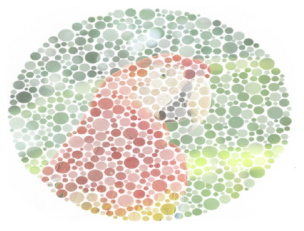

In [ ]:
im = Image.open('images/parrot.png')
print(im.mode)
im = im.convert('RGBA')
im_alpha = ImageOps.invert(Image.open("images/Ishihara.png").convert('L'))
im.putalpha(im_alpha.resize((im.width, im.height)))
im.save('images/parrot_alpha.png')
plt.imshow(im), plt.axis('off')
plt.show()

## Data Types

### Inspecting Data Type of an Image

In [ ]:
from skimage.io import imread
import numpy as np

image = imread('images/parrot.png')  # Automatically returns uint8
print("Image dtype:", image.dtype)
print("Pixel range:", image.min(), "to", image.max())

Image dtype: uint8
Pixel range: 0 to 255


### Converting Between Data Types

In [ ]:
# Normalize image to float [0, 1]
image_float = image.astype(np.float32) / 255.0
print("Float dtype:", image_float.dtype)
print("New range:", image_float.min(), "to", image_float.max())

Float dtype: float32
New range: 0.0 to 1.0


### ⚠️ Caution: Overflow and Clipping
When operating on uint8 images, be careful with arithmetic operations:

In [ ]:
#bright = image + 100  # WRONG: causes overflow if dtype is uint8
bright = np.clip(image.astype(np.int16) + 100, 0, 255).astype(np.uint8)

image_float = image.astype(np.float32) / 255.0
bright_float = np.clip(image_float + 0.4, 0.0, 1.0)

### Binary Masks with Boolean Images

In [ ]:
from skimage.color import rgb2gray

gray = rgb2gray(image)  # Returns float image [0, 1]
mask = gray > 0.5       # Boolean mask
print("Mask dtype:", mask.dtype)  # Output: bool

Mask dtype: bool


### Color Gamut

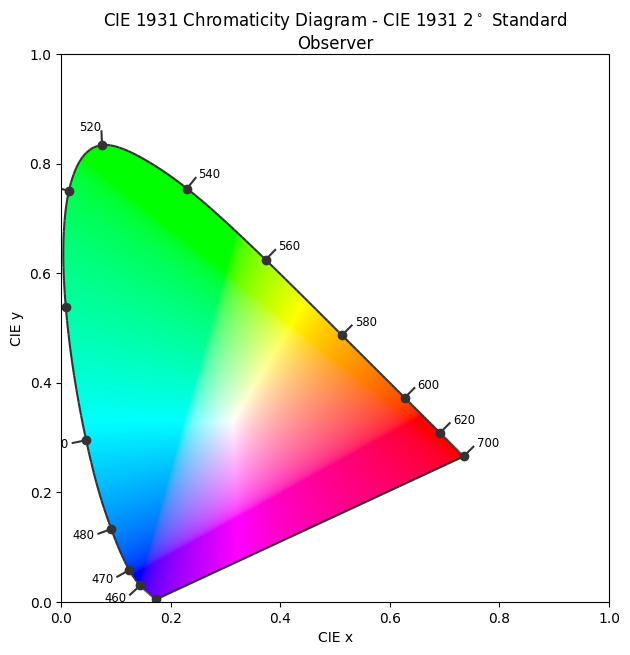

In [ ]:
# pip install colour-science
from colour.plotting import plot_chromaticity_diagram_CIE1931
import matplotlib.pylab as plt
plot_chromaticity_diagram_CIE1931()
plt.show()

## Color spaces

![](https://github.com/rahiakela/Hands-On-Image-Processing-and-Computer-Vision-with-Python/blob/main/Chapter01/images/rgb_yiq.png?raw=1)

### Converting from one color space to another

In [ ]:
im = imread("images/parrot.png")
im_hsv = color.rgb2hsv(im)
plt.figure(figsize=(15,6))
plt.gray()
plt.subplot(131), plt.axis('off'), plt.title('hue', size=20), plt.imshow(im_hsv[...,0], cmap='Reds')
plt.subplot(132), plt.axis('off'), plt.title('saturation', size=20), plt.imshow(im_hsv[...,1])
plt.subplot(133), plt.axis('off'), plt.title('value', size=20), plt.imshow(im_hsv[...,2])
plt.tight_layout()
plt.show()
#show()

Similarly, we can convert the image to YUV color-space using the following code.

In [ ]:
im_yuv = color.rgb2yuv(im)
imsave('images/parrot_yuv.png', (255*im_yuv).astype(np.uint8))

### Color Enhancement in HSV colorspace

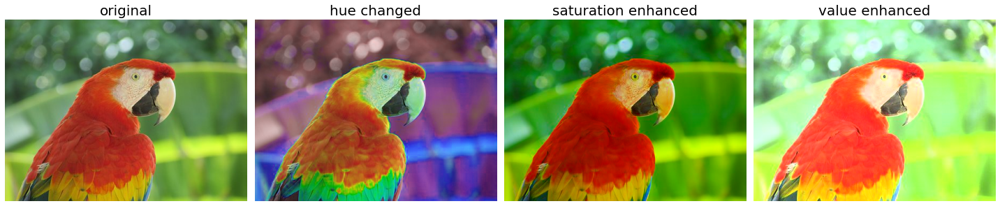

In [ ]:
def multiply_channel_hsv(im, i, f):
    im_hsv = color.rgb2hsv(im)
    im_hsv[...,i] = np.minimum(f*im_hsv[...,i], 1)
    return color.hsv2rgb(im_hsv)

im = imread('images/parrot.png')
plt.figure(figsize=(20,7))
plt.subplot(141), plt.axis('off'), plt.title('original', size=20), plt.imshow(im)
plt.subplot(142), plt.axis('off'), plt.title('hue changed', size=20), plt.imshow(multiply_channel_hsv(im, 0, 3))
plt.subplot(143), plt.axis('off'), plt.title('saturation enhanced', size=20), plt.imshow(multiply_channel_hsv(im, 1, 2.5))
plt.subplot(144), plt.axis('off'), plt.title('value enhanced', size=20), plt.imshow(multiply_channel_hsv(im, 2, 2))
plt.tight_layout()
plt.show()

### Tinting gray-scale images in HSV colorspace

#### Displaying the Hue Gradient

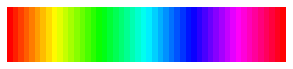

In [ ]:
hue_gradient = np.linspace(0, 1)
hsv = np.ones(shape=(1, len(hue_gradient), 3), dtype=float)
hsv[:, :, 0] = hue_gradient
all_hues = color.hsv2rgb(hsv)

fig, ax = plt.subplots(figsize=(5, 2))
# Set image extent so hues go from 0 to 1 and the image is a nice aspect ratio.
ax.imshow(all_hues, extent=(0 - 0.5 / len(hue_gradient),
                            1 + 0.5 / len(hue_gradient), 0, 0.2))
ax.set_axis_off()

#### Colorize a grayscale image with Vintage look

In [ ]:
def colorize(im, hue, saturation=1):
    """ Add color of the given hue to an RGB im.

    By default, set the saturation to 1 so that the colors pop!
    """
    hsv = color.rgb2hsv(im)
    hsv[:, :, 1] = saturation
    hsv[:, :, 0] = hue
    return color.hsv2rgb(hsv)

im = imread('images/man.jpg')
hue_rotations = np.linspace(0, 1, 6)
fig, axes = plt.subplots(nrows=1, ncols=7, sharex=True, sharey=True, figsize=(15,4))
axes[0].imshow(im), axes[0].set_axis_off(), axes[0].set_title('grayscale', size=15)
for ax, hue in zip(axes.flat[1:], hue_rotations):
    # Turn down the saturation to give it that vintage look.
    tinted_im = colorize(im, hue, saturation=0.3)
    ax.imshow(tinted_im, vmin=0, vmax=1)
    ax.set_axis_off()
fig.tight_layout()

### Implementing Color Pop Effect with Hue filtering and Saturation Modfication

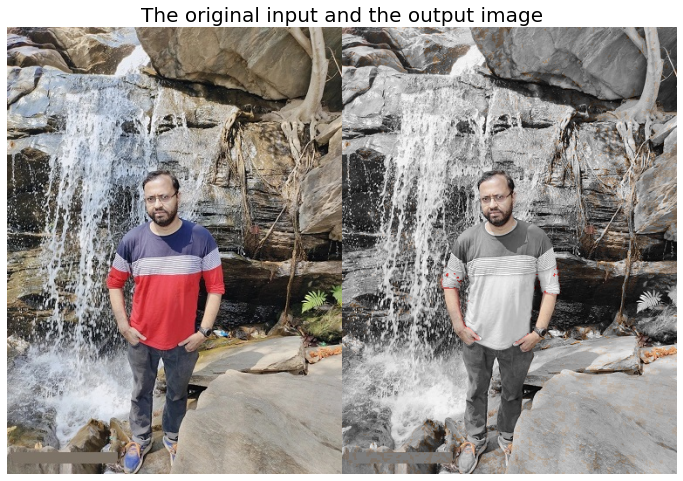

In [ ]:
im = imread('images/me.jpg')
im = im / im.max()
im_hsv = color.rgb2hsv(im)
im_hsv[im_hsv[...,0] > 0.09,1] = 0
im_out = color.hsv2rgb(im_hsv)
plt.figure(figsize=(12,12))
plt.imshow(np.hstack((im,im_out))), plt.axis('off')
plt.title('The original input and the output image', size=20)
plt.show()

### Color Enhancement in RGB Colorspace

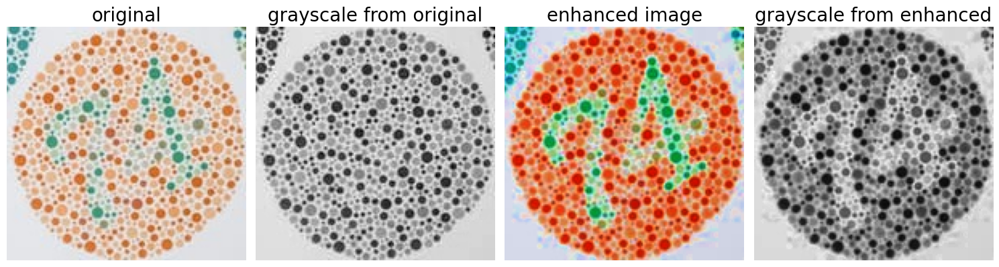

In [ ]:
def enhance_rgb(im, f=4):
    im = im.copy()
    r, g, b = im[...,0], im[...,1], im[...,2]
    m = np.maximum(np.maximum(r, g), b)
    im[...,0], im[...,1], im[...,2] = (r/m)**f*m, (g/m)**f*m, (b/m)**f*m
    return im

im = imread('images/ishihara.png')[...,:3]
im_en = enhance_rgb(im)
plt.figure(figsize=(15,5))
plt.gray()
plt.subplot(141), plt.axis('off'), plt.title('original', size=20), plt.imshow(im)
plt.subplot(142), plt.axis('off'), plt.title('grayscale from original', size=20), plt.imshow(color.rgb2gray(im))
plt.subplot(143), plt.axis('off'), plt.title('enhanced image', size=20), plt.imshow(im_en)
plt.subplot(144), plt.axis('off'), plt.title('grayscale from enhanced', size=20), plt.imshow(color.rgb2gray(im_en))
plt.tight_layout()
plt.show()

### Color Shifting in CIELab colorspace

In [ ]:
def add_channel_lab(im, i, x):
    im_lab = color.rgb2lab(im)
    im_lab[...,i] = x + im_lab[...,i]
    return color.lab2rgb(im_lab)

im = imread('images/scene.jpg')
plt.figure(figsize=(15,5))
plt.subplot(141), plt.axis('off'), plt.title('original', size=20), plt.imshow(im)
plt.subplot(142), plt.axis('off'), plt.title('luminosity changed', size=20), plt.imshow(add_channel_lab(im, 0, 50))
plt.subplot(143), plt.axis('off'), plt.title('red tinted', size=20), plt.imshow(add_channel_lab(im, 1, 10))
plt.subplot(144), plt.axis('off'), plt.title('cooled', size=20), plt.imshow(add_channel_lab(im, 2, -25))
plt.tight_layout()
plt.show()

### Skin color detection with HSV and YCbCr Colorspace

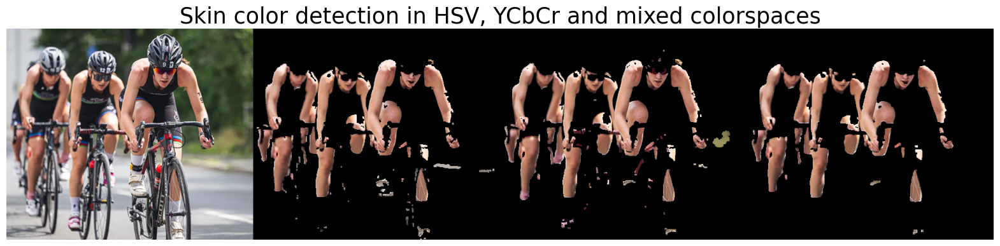

In [ ]:
# Constants for HSV and YCrCb skin detection thresholds
HSV_LOWER = (0, 15, 0)
HSV_UPPER = (17, 170, 255)
YCrCb_LOWER = (0, 135, 85)
YCrCb_UPPER = (255, 180, 135)

#def detect_skin_color(img):
def detect_skin_color(img: np.ndarray) -> tuple[np.ndarray, np.ndarray, np.ndarray, np.ndarray]:
    """
    Detects human skin regions in an image using HSV and YCrCb color space thresholds.

    Args:
        img (np.ndarray): Input BGR image (as loaded by OpenCV).

    Returns:
        Tuple[np.ndarray, np.ndarray, np.ndarray, np.ndarray]:
            A tuple of RGB images showing:
            - Original image
            - Skin regions detected via HSV
            - Skin regions detected via YCrCb
            - Combined mask of both methods
    """
    #converting from gbr to hsv color space
    img_HSV = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    #skin color range for hsv color space
    HSV_mask = cv2.inRange(img_HSV, HSV_LOWER, HSV_UPPER)
    HSV_mask = cv2.morphologyEx(HSV_mask, cv2.MORPH_OPEN, np.ones((3,3), np.uint8))
    #converting from gbr to YCbCr color space
    img_YCrCb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    YCrCb_mask = cv2.inRange(img_YCrCb, YCrCb_LOWER, YCrCb_UPPER)
    # skin color range for YCbCr color space
    YCrCb_mask = cv2.morphologyEx(YCrCb_mask, cv2.MORPH_OPEN, np.ones((3,3), np.uint8))
    # merge skin detection (YCbCr and hsv)
    global_mask = np.bitwise_and(YCrCb_mask,HSV_mask)
    global_mask = cv2.medianBlur(global_mask,3)
    global_mask = cv2.morphologyEx(global_mask, cv2.MORPH_OPEN, np.ones((4,4), np.uint8))

    img_RGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    out_HSV = cv2.cvtColor(img & color.gray2rgb(HSV_mask),  \
                                           cv2.COLOR_BGR2RGB)
    out_YCrCb = cv2.cvtColor(img & color.gray2rgb(YCrCb_mask), \
                             cv2.COLOR_BGR2RGB)
    out_global = cv2.cvtColor(img & color.gray2rgb(global_mask), \
                                           cv2.COLOR_BGR2RGB)
    return img_RGB, out_HSV, out_YCrCb, out_global

img = cv2.imread("images/cycling.png")
img_RGB, out_HSV, out_YCrCb, out_global = detect_skin_color(img)

plt.figure(figsize=(20,7))
plt.imshow(np.hstack((img_RGB, out_HSV, out_YCrCb, out_global))), plt.axis('off')
plt.title('Skin color detection in HSV, YCbCr and mixed colorspaces',
                                                             size=25)
plt.show()

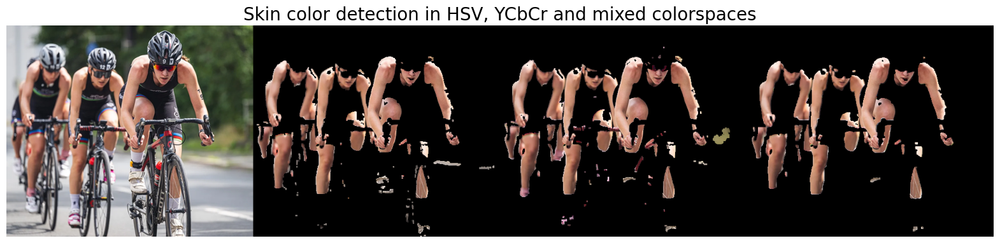

In [ ]:
#Open a simple image
img = cv2.imread("images/cycling.png")

#converting from gbr to hsv color space
img_HSV = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
HSV_mask = cv2.inRange(img_HSV, (0, 15, 0), (17,170,255)) #skin color range for hsv color space
HSV_mask = cv2.morphologyEx(HSV_mask, cv2.MORPH_OPEN, np.ones((3,3), np.uint8))

#converting from gbr to YCbCr color space
img_YCrCb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
YCrCb_mask = cv2.inRange(img_YCrCb, (0, 135, 85), (255,180,135)) #skin color range for YCbCr color space
YCrCb_mask = cv2.morphologyEx(YCrCb_mask, cv2.MORPH_OPEN, np.ones((3,3), np.uint8))

#merge skin detection (YCbCr and hsv)
global_mask = np.bitwise_and(YCrCb_mask,HSV_mask)
global_mask = cv2.medianBlur(global_mask,3)
global_mask = cv2.morphologyEx(global_mask, cv2.MORPH_OPEN, np.ones((4,4), np.uint8))

img_RGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
out_HSV = cv2.cvtColor(img & color.gray2rgb(HSV_mask), cv2.COLOR_BGR2RGB)
out_YCrCb = cv2.cvtColor(img & color.gray2rgb(YCrCb_mask), cv2.COLOR_BGR2RGB)
out_global = cv2.cvtColor(img & color.gray2rgb(global_mask), cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,7))
plt.imshow(np.hstack((img_RGB, out_HSV, out_YCrCb, out_global))), plt.axis('off')
plt.title('Skin color detection in HSV, YCbCr and mixed colorspaces', size=20)
plt.show()

### Data structures to store images

### Converting the image data structures

In [ ]:
im = Image.open('images/flowers.jpg') # read image into an Image object with PIL
im = np.array(im) # create a numpy ndarray from the Image object
plt.figure(figsize=(10,5))
plt.imshow(im) # use skimage imshow to display the image
plt.axis('off')
plt.show()

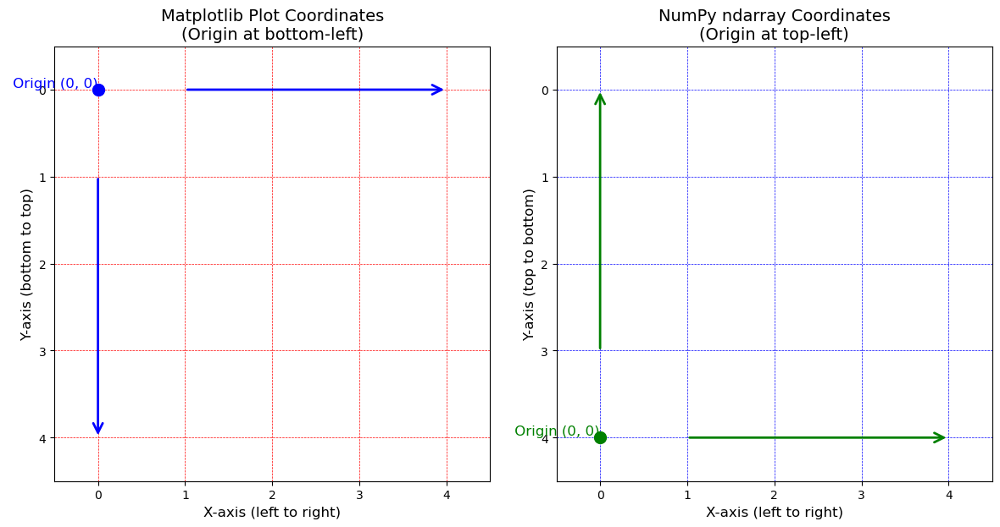

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Create a sample image array
image_array = (255*np.ones((5, 5))).astype(np.uint8)

# Plot using Matplotlib with default coordinates
plt.figure(figsize=(12, 6))

# Subplot 1: Matplotlib coordinates
plt.subplot(1, 2, 1)
plt.imshow(image_array, cmap='gray_r', origin='upper')
plt.title('Matplotlib Plot Coordinates\n(Origin at bottom-left)', fontsize=14)
plt.xlabel('X-axis (left to right)', fontsize=12)
plt.ylabel('Y-axis (bottom to top)', fontsize=12)
plt.grid(True, which='both', color='red', linestyle='--', linewidth=0.5)

# Add x and y axis arrows for Matplotlib coordinates
plt.annotate('', xy=(4, 0), xytext=(1, 0), arrowprops=dict(arrowstyle="->", color='blue', linewidth=2, mutation_scale=20))
plt.annotate('', xy=(0, 4), xytext=(0, 1), arrowprops=dict(arrowstyle="->", color='blue', linewidth=2, mutation_scale=20))

# Mark the origin (0, 0) in Matplotlib coordinates
plt.scatter([0], [0], color='blue', s=100, zorder=5)
plt.text(0, 0, ' Origin (0, 0)', fontsize=12, verticalalignment='bottom', horizontalalignment='right', color='blue')

# Subplot 2: NumPy coordinates
plt.subplot(1, 2, 2)
plt.imshow(image_array, cmap='gray_r', origin='upper')
plt.title('NumPy ndarray Coordinates\n(Origin at top-left)', fontsize=14)
plt.xlabel('X-axis (left to right)', fontsize=12)
plt.ylabel('Y-axis (top to bottom)', fontsize=12)
plt.grid(True, which='both', color='blue', linestyle='--', linewidth=0.5)

# Add x and y axis arrows for NumPy coordinates
plt.annotate('', xy=(4, 4), xytext=(1, 4), arrowprops=dict(arrowstyle="->", color='green', linewidth=2, mutation_scale=20))
plt.annotate('', xy=(0, 0), xytext=(0, 3), arrowprops=dict(arrowstyle="->", color='green', linewidth=2, mutation_scale=20))

# Mark the origin (0, 0) in NumPy coordinates
plt.scatter([0], [4], color='green', s=100, zorder=5)
plt.text(0, 4, ' Origin (0, 0)', fontsize=12, verticalalignment='bottom', horizontalalignment='right', color='green')

plt.tight_layout()
plt.show()

## Image Manipulations with numpy


### with array slicing

In [ ]:
lena = mpimg.imread("images/monalisa.jpg") # read the image from disk as a numpy ndarray
lx, ly = lena.shape[:2]
print(lena[0, 40])
#print(lena[10:13, 20:23,0:1]) # slicing
X, Y = np.ogrid[0:lx, 0:ly]
mask = (X - lx / 2) ** 2 + (Y - ly / 2) ** 2 > lx * ly / 4
print(lena.flags)
lena = lena.copy()
lena[np.where(mask)] = 0 # masks
plt.figure(figsize=(5,5))
plt.imshow(lena), plt.axis('off')
plt.show()

### Simple Image Morphing: α-blending of two images using cross-dissolving

In [ ]:
im1 = mpimg.imread("images/me_young.jpg")
im2 = mpimg.imread("images/me_now.jpg")
im1, im2 = im1 / im1.max(), im2 / im2.max()
i = 1
plt.figure(figsize=(12,8))
for alpha in np.linspace(0,1,18):
    plt.subplot(3,6,i), plt.imshow((1-alpha)*im1 + alpha*im2), plt.axis('off')
    i += 1
plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()

### Dividing two images to remove illumination pattern

In [ ]:
img = cv2.imread('images/board.jpg', 0)
plt.imsave('images/board_illum_pat.png', img/img.max()*img2/img2.max())

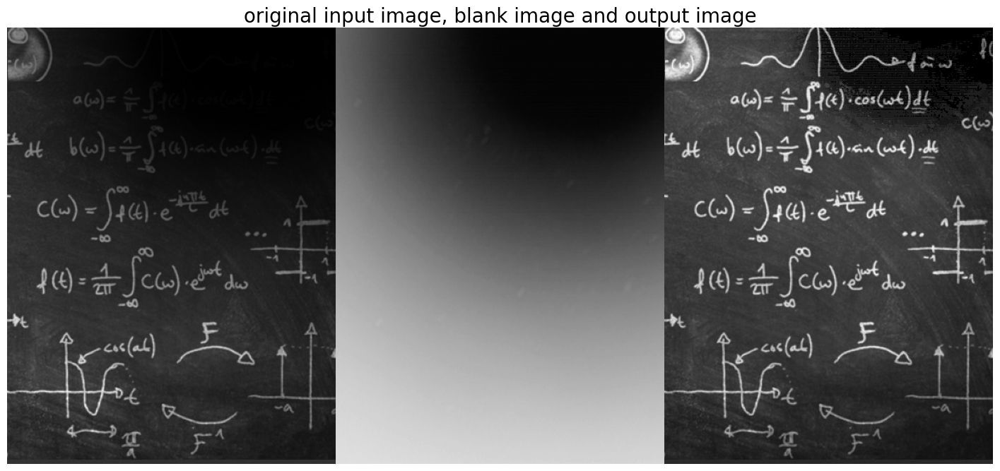

In [ ]:
# Load the two images
img1 = cv2.imread('images/board_illum_pat.png', 0)
img2 = cv2.imread('images/pattern.png', 0)

# Divide the two images
out = np.divide(img1.astype(float), img2.astype(float)+0.001)
out = out / out.max()
out = (255*out).astype('uint8')

# Display the original and enhanced images
plt.figure(figsize=(18,9))
plt.gray()
plt.imshow(np.hstack((img1, img2, out))), plt.axis('off')
plt.title('original input image, blank image and output image', size=20)
plt.show()

### Applying Sepia Color Filter

In [ ]:
def sepia_filter(im):
    R, G, B = im[...,0], im[...,1], im[...,2]
    im_out = im.copy()
    im_out[...,0] = 0.393 * R + 0.769 * G + 0.189 * B
    im_out[...,1]  = 0.349 * R + 0.686 * G + 0.168 * B
    im_out[...,2]  = 0.272 * R + 0.534 * G + 0.131 * B
    im_out = np.clip(im_out, 0, 1)
    return im_out

im = imread('images/sea_beach.jpeg')
im = im / im.max()
im_out = sepia_filter(im)
plt.figure(figsize=(12,5))
plt.imshow(np.hstack((im, im_out))), plt.axis('off')
plt.show()

time (np): 0.075505 sec
time (PIL): 1.350692 sec


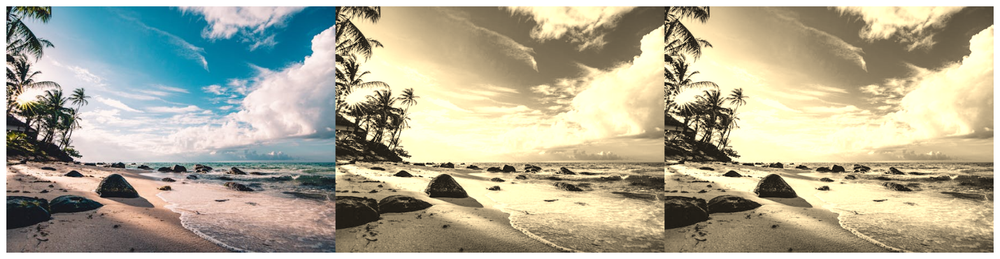

In [ ]:
def sepia_filter_PIL(image_path):
    img = Image.open(image_path)
    width, height = img.size
    pixels = img.load() # create the pixel map
    for py in range(height):
        for px in range(width):
            r, g, b = img.getpixel((px, py))
            pixels[px, py] = (min(255, int(0.393 * r + 0.769 * g + 0.189 * b)), \
                              min(255, int(0.349 * r + 0.686 * g + 0.168 * b)), \
                              min(255, int(0.272 * r + 0.534 * g + 0.131 * b)))
    return img


def sepia_filter_np(image_path):
    im = plt.imread(image_path)
    im = im / im.max()
    R, G, B = im[...,0], im[...,1], im[...,2]
    im_out = np.dstack((0.393 * R + 0.769 * G + 0.189 * B, \
                        0.349 * R + 0.686 * G + 0.168 * B, \
                        0.272 * R + 0.534 * G + 0.131 * B))
    im_out = np.clip(im_out, 0, 1)
    return (255*im_out).astype(np.uint8)

img_path = 'images/sea_beach.jpeg'
start = time()
im_out_np = sepia_filter_np(img_path)
print('time (np): {:03f} sec'.format(time() - start))
start = time()
im_out_PIL = sepia_filter_PIL(img_path)
print('time (PIL): {:03f} sec'.format(time() - start))
im, im_out_PIL = plt.imread(img_path), np.array(im_out_PIL)
plt.figure(figsize=(20,7))
plt.imshow(np.hstack((im, im_out_np, im_out_PIL))), plt.axis('off')
plt.show()

## Drawing Contour lines for an image

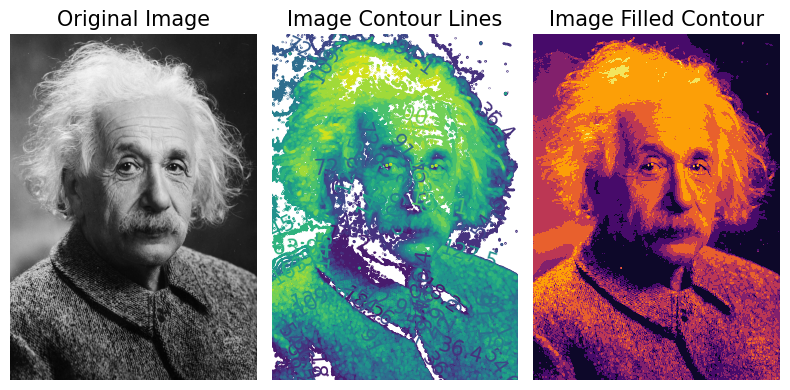

In [ ]:
im = imread("images/einstein.jpg") # read image as a numpy ndarray
plt.figure(figsize=(8,4))
plt.subplot(131), plt.imshow(im, cmap='gray', aspect='auto'),
plt.axis('off'), plt.title('Original Image', size=15)
plt.subplot(132)
cs = plt.contour(np.flipud(im), levels=np.linspace(0,255,15), camp=plt.cm.hot)
plt.clabel(cs, fontsize=15, inline=True)
plt.axis('off')
plt.title('Image Contour Lines', size=15)
plt.subplot(133), plt.title('Image Filled Contour', size=15),
plt.contourf(np.flipud(im), cmap='inferno'), plt.axis('off')
plt.tight_layout()
plt.show()

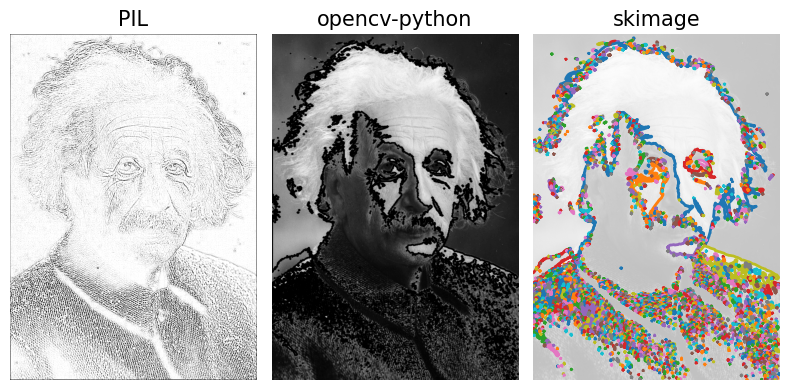

In [ ]:
im = Image.open("images/einstein.jpg")
im_ctr = im.filter(ImageFilter.CONTOUR)
im = cv2.imread("images/einstein.jpg")
im_gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
_, thresh = cv2.threshold(im_gray, 127, 255, 0)
contours, hierarchy = cv2.findContours(image=thresh, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_SIMPLE)
cv2.drawContours(image=im_gray, contours=contours, contourIdx=-1, color=(0, 0, 0), thickness=2, lineType=cv2.LINE_AA)
im = imread("images/einstein.jpg", True) # read image as a numpy ndarray
im = im / im.max()
contours = measure.find_contours(im, 0.5) #, fully_connected="high")
plt.figure(figsize=(8,4))
plt.gray()
plt.subplot(131), plt.imshow(im_ctr, aspect='auto'), plt.axis('off')
plt.title('PIL', size=15)
plt.subplot(132), plt.imshow(im_gray, aspect='auto'), plt.axis('off')
plt.title('opencv-python', size=15)
plt.subplot(133), plt.imshow(im, aspect='auto', alpha=0.25), plt.axis('off')
plt.title('skimage', size=15)
for contour in contours:
    plt.plot(contour[:, 1], contour[:, 0], linewidth=2)
plt.tight_layout()
plt.show()

## Questions

Now that you\'ve gained foundational knowledge in digital image
processing and explored key concepts and techniques, it\'s time to put
your understanding to the test with practical exercises. Let\'s dive
into hands-on problem-solving to strengthen your skills further.

**1.** Apply first a translation ($t_{x} = 5$ , $t_{y} = 3$) and then a rotation ($\theta = \frac{\pi}{6}$) transform to an image. Show that you   obtain the same transformation with a Euclidean transformation (skimage.transform.EuclideanTransform) with the appropriate transformation matrix. Mathematically, you have the following geometric transformation:\\

   $T = \begin{bmatrix}
    cos\theta & - sin\theta & 0 \\
    sin\theta & cos\theta & 0 \\
    0 & 0 & 1
    \end{bmatrix}\begin{bmatrix}
    1 & 0 & t_{x} \\
    0 & 1 & t_{y} \\
    0 & 0 & 1
    \end{bmatrix} = \begin{bmatrix}
    cos\theta & - sin\theta & t_{x}cos\theta - t_{y}sin\theta \\
    sin\theta & cos\theta & t_{x}sin\theta + t_{y}cos\theta \\
    0 & 0 & 1
    \end{bmatrix}$

  **Hint**

-   First, warp the input image with the translation matrix and then
    warp the output image obtained with the rotation matrix.

-   Next, warp the input image with the product of translation and
    rotation matrix.

    You should obtain a figure like the following using the following inputimage:

    ![A collage of a person\'s face AI-generated content may be incorrect.](https://github.com/rahiakela/Hands-On-Image-Processing-and-Computer-Vision-with-Python/blob/main/Chapter01/images/zelda_rotate.png?raw=1)\


**2.** Start with the **zelda** input image (as shown below). Implement a function `create_gif()` to create an animated GIF by rotating the image  around its center, by using `PIL.Image.save()` (use the `append_images`, `save_all`, `duration` and the `loop` arguments to the function `save()`. Rotate the image by the center using `skimage.warp()` or `PIL.Image.rotate()` function). A few frames extracted from the animated GIF are shown below.

   ![A person with big hair AI-generated content may be incorrect.](https://github.com/rahiakela/Hands-On-Image-Processing-and-Computer-Vision-with-Python/blob/main/Chapter01/images/zelda_anim.png?raw=1)\
                            **Rotating image with skimage warp**

   **Hint**

   In `matplotlib.pylab.imshow()` function, the `alpha` parameter controls the transparency of the displayed image. It allows you to specify the alpha (opacity) value for the entire image or for each pixel individually. The alpha parameter is a scalar or a 2D array of alpha values, where $0$ is fully transparent and $1$ is fully opaque.

   As demonstrated in the next code snippet, the `alpha` parameter can be passed to `plt.imshow()` to control the transparency, e.g., `alpha`=0.5 makes the entire image semi-transparent, allowing the underlying content to show through.

   Add **nested decorators** to the `python` function `plot_image()` defined below, the first decorator (`remove_axis`) should remove axis ticks and labels while plotting and the second one (`plot_gray`) will plot the image in gray colormap, if the image is a grayscale image. Note that you can't change the code inside `plot_image()`. Your function `plot_image()` should use the **decorators** you implemented chained like the following:

In [ ]:
@remove_axis
@plot_gray
def plot_image(img, alpha):
    plt.imshow(img, alpha=alpha)
    plt.show()

so that you get the following outputs by calling the function with a RGB
color image (e.g., the famous Lenna image) and a 2D grayscale image,
respectively.

`plot_image(plt.imread('lena_color.jpg'), 0.4)`

**Darkening color image with decorator**

![A person wearing a hat AI-generated content may be incorrect.](https://github.com/rahiakela/Hands-On-Image-Processing-and-Computer-Vision-with-Python/blob/main/Chapter01/images/lena_dark.png?raw=1)\


**3.** **Detecting Red Cars in a Traffic Video Using HSV Color Segmentation**

Build a color-based object detection system to identify red-colored cars in a traffic video. Your goal is to extract frames from the video, segment the red regions (potentially red cars), and visualize the detection process in real-time using an animation. Your Task is to create a python program that

- Reads frames from a traffic surveillance video (e.g., cars.mp4).
- Converts each frame to the HSV color space.
- Segments out red-colored regions using appropriate hue thresholding.
- Displays an animated side-by-side view:
  - The original video frame
  - The corresponding binary red mask highlighting red cars
  - Runs the animation interactively in a Jupyter Notebook, or saves the result as a GIF or MP4.

**Hints**

- Red color appears in two ranges in HSV:
- Lower red: H in $[0, 10]$
- Upper red: H in $[160, 180]$
- Use `cv2.inRange()` to threshold the HSV image for both ranges and combine them.
- Use `cv2.morphologyEx()` with `cv2.MORPH_OPEN` and `cv2.MORPH_DILATE` to remove noise and fill gaps in red regions.
- Use `FuncAnimation` from `matplotlib.animation` to animate the results frame-by-frame.

Observe the effectiveness of hue-based segmentation for isolating red cars, how noise or lighting conditions may affect detection quality and ghe role of morphology in refining segmentation masks. role of morphology in refining segmentation masks. You should obtain an animation like the following one:

![](https://github.com/rahiakela/Hands-On-Image-Processing-and-Computer-Vision-with-Python/blob/main/Chapter01/images/red_cars.gif?raw=1)